# Imports

In [1]:
import scanpy as sc
import pandas as pd
import torch
import numpy

import fiberedae.models.fae as vmod
import fiberedae.utils.basic_trainer as vtrain
import fiberedae.utils.persistence as vpers
import fiberedae.utils.single_cell as vsc
import fiberedae.utils.nn as vnnutils
import fiberedae.utils.plots as vplots
import fiberedae.utils.fae as vfae
import fiberedae.utils.datasets as vdatasets

from anndata import AnnData

import fiberedae.utils.useful as us

/home/tariq/miniconda3/envs/blood/lib/python3.7/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


# Loading dataset and configuration

In [2]:
config = us.load_configuration("configurations/mnist.json")
dataset = us.load_dataset(config)

In [ ]:
model_args = dict(config["model"])
model_args.update(
    dict(
        x_dim=dataset["shapes"]["input_size"],
        nb_class=dataset["shapes"]["nb_class"],
        output_transform=vnnutils.ScaleNonLinearity(-1., 1., dataset["sample_scale"][0], dataset["sample_scale"][1]),
    )
)
#make model
model = vmod.FiberedAE(**model_args)
model.to("cuda")

#train model
trainer, history = us.train(model, dataset, config, nb_epochs=config["hps"]["nb_epochs"])

  0%|          | 0/200 [00:00<?, ?it/s]

running on: cuda


re: 0.0704,coad: 2.3528,pr: 2.2983,cofige: 2.3012,gage: 0.5606,gadi: 0.7569:   1%|          | 2/200 [00:18<30:09,  9.14s/it]

In [8]:
vpers.save_model(model, {}, history, {}, dataset["label_encoding"], model_args,
                 "./trained_models/mnist_%e.pytorch.mdl" % config["hps"]["nb_epochs"] 
                )

In [42]:
#model = vpers.load_model("./trained_models/mnist_200e.pytorch.mdl", vmod.FiberedAE, "cpu")[0]

## Learning curves

In [ ]:
vplots.interactive_line_plots(
    dct_values = {
        "R": history["train"]["reconstruction"]
    },
    x_label = "epochs",
    y_label = "loss",
)

# Plots

## Base space

In [9]:
latent_space = vfae.get_latent_space(
    model=model,
    data_loader=dataset["loaders"]["train"],
    batch_formater=dataset["batch_formater"],
    label_encoding=dataset["label_encoding"]
)

<module 'matplotlib.pyplot' from '/home/tariq/miniconda3/envs/mldev/lib/python3.7/site-packages/matplotlib/pyplot.py'>

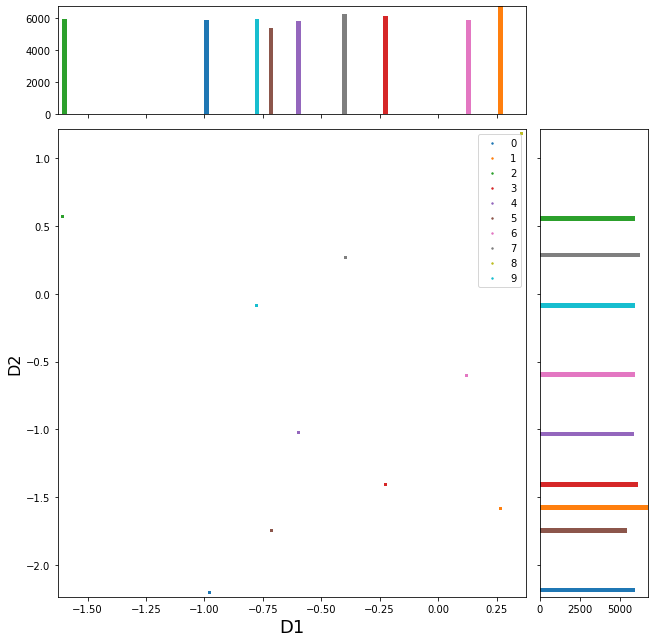

In [10]:
vplots.plot_latent(latent_space["base_space"], latent_space["str_labels"], point_opacity=1 )

## Fiber space

<module 'matplotlib.pyplot' from '/home/tariq/miniconda3/envs/mldev/lib/python3.7/site-packages/matplotlib/pyplot.py'>

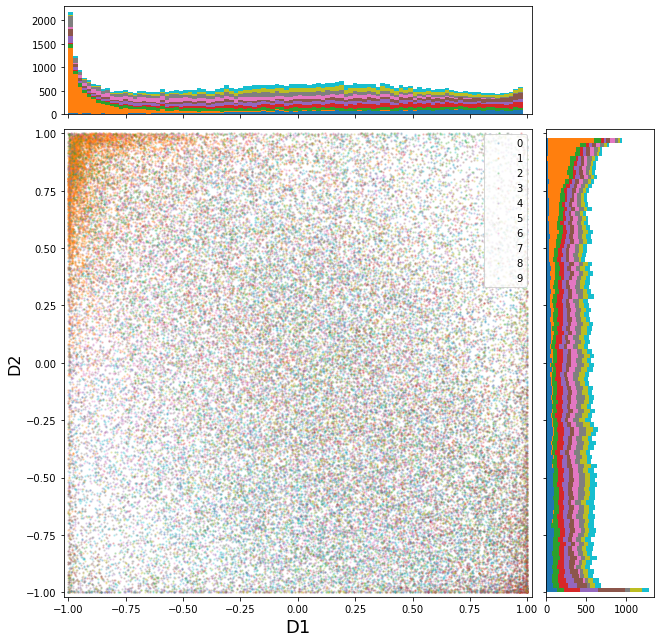

In [7]:
vplots.plot_latent(latent_space["fiber_space"], latent_space["str_labels"])

In [ ]:
## Naive trans

<module 'matplotlib.pyplot' from '/home/tariq/miniconda3/envs/mldev/lib/python3.7/site-packages/matplotlib/pyplot.py'>

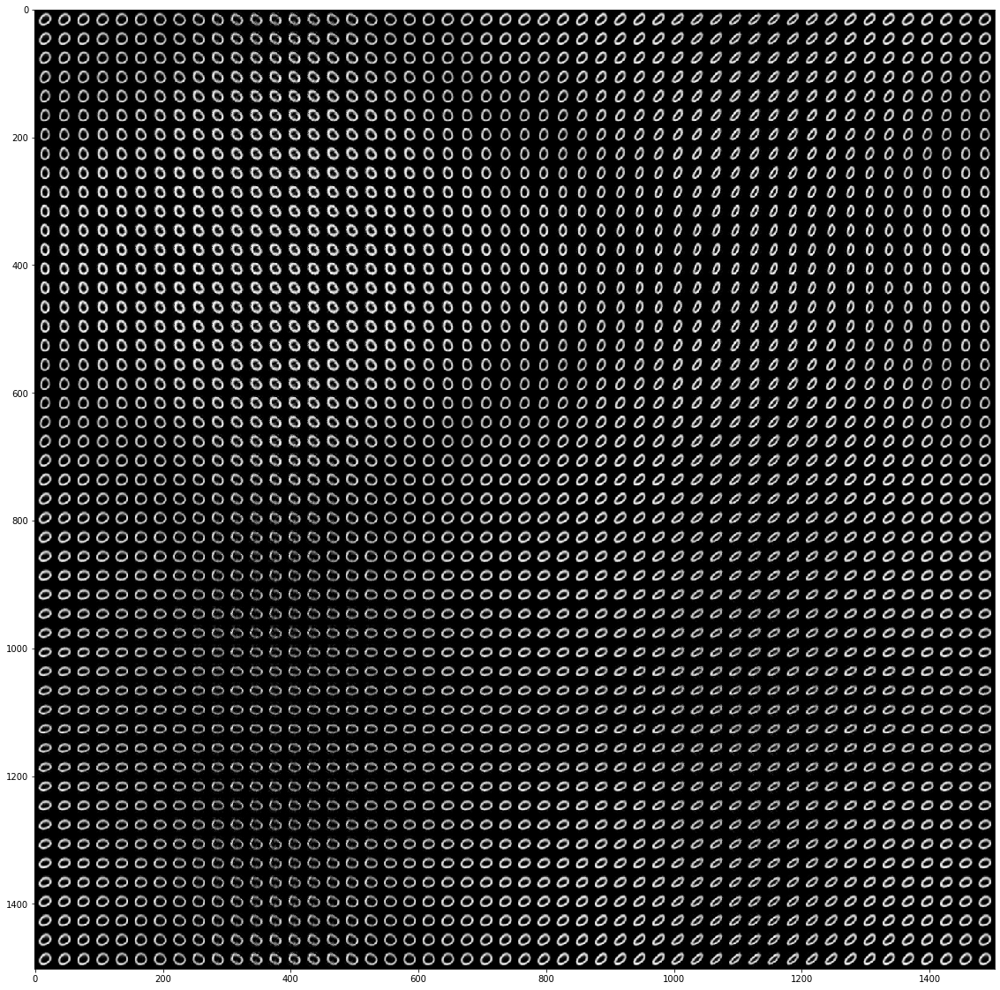

In [19]:
vplots.latent_grid_plot(
    model=model,
    condition=0,
    nb_ticks=50,
    start=0,
    stop=2*numpy.pi
)

<module 'matplotlib.pyplot' from '/home/tariq/miniconda3/envs/mldev/lib/python3.7/site-packages/matplotlib/pyplot.py'>

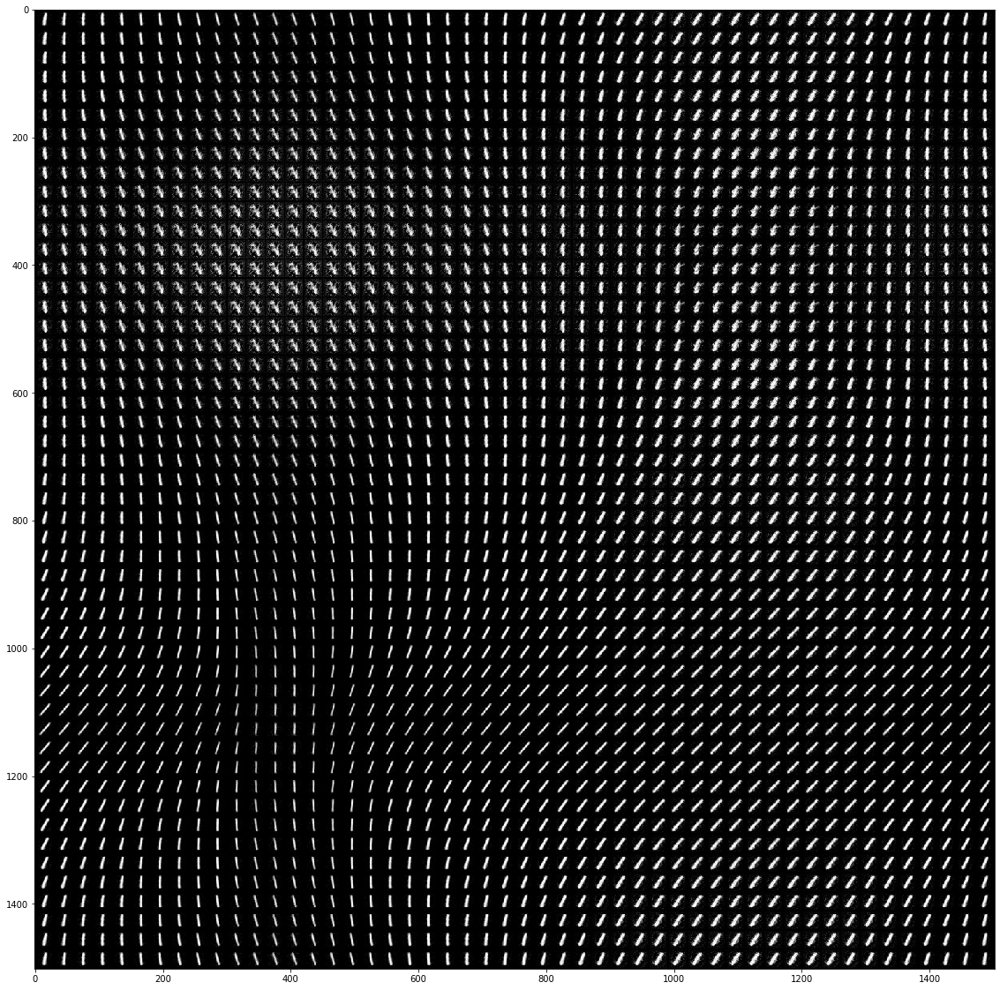

In [18]:
vplots.latent_grid_plot(
    model=model,
    condition=1,
    nb_ticks=50,
    start=0,
    stop=2*numpy.pi
)

<module 'matplotlib.pyplot' from '/home/tariq/miniconda3/envs/mldev/lib/python3.7/site-packages/matplotlib/pyplot.py'>

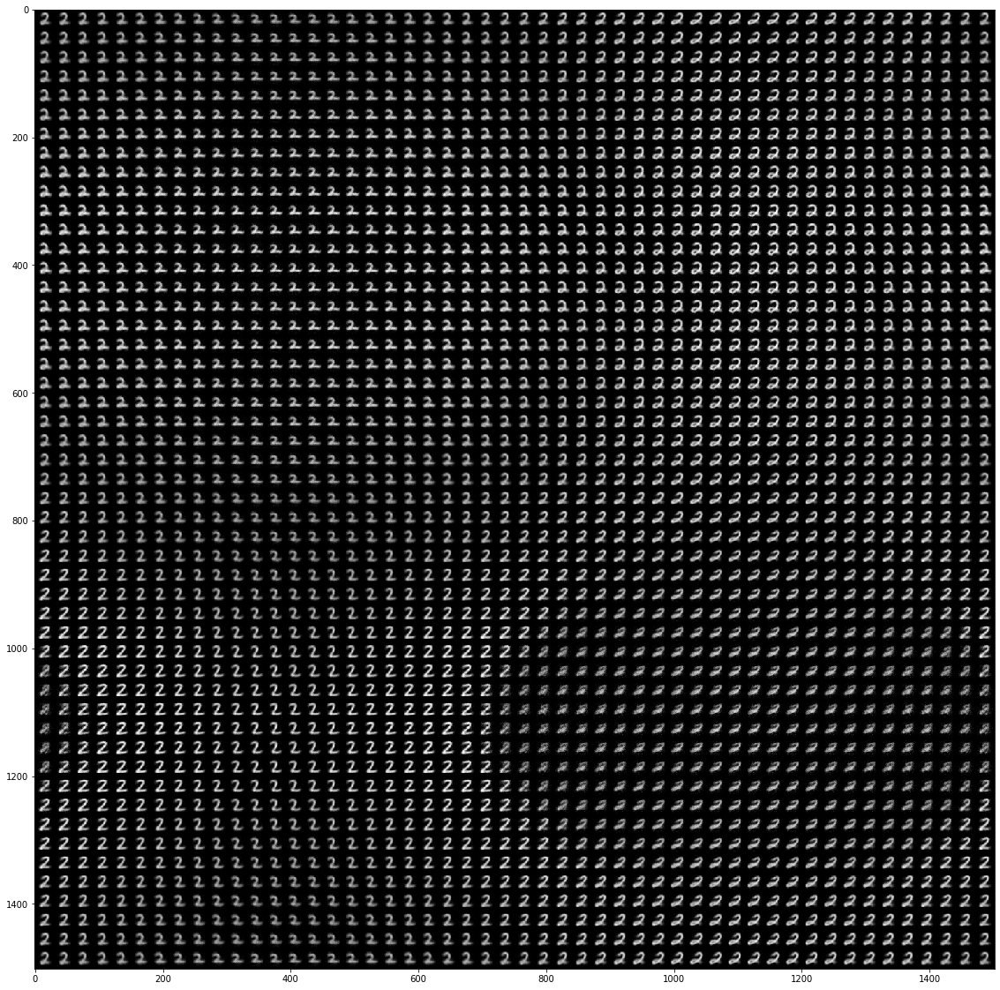

In [17]:
vplots.latent_grid_plot(
    model=model,
    condition=2,
    nb_ticks=50,
    start=0,
    stop=2*numpy.pi
)

<module 'matplotlib.pyplot' from '/home/tariq/miniconda3/envs/mldev/lib/python3.7/site-packages/matplotlib/pyplot.py'>

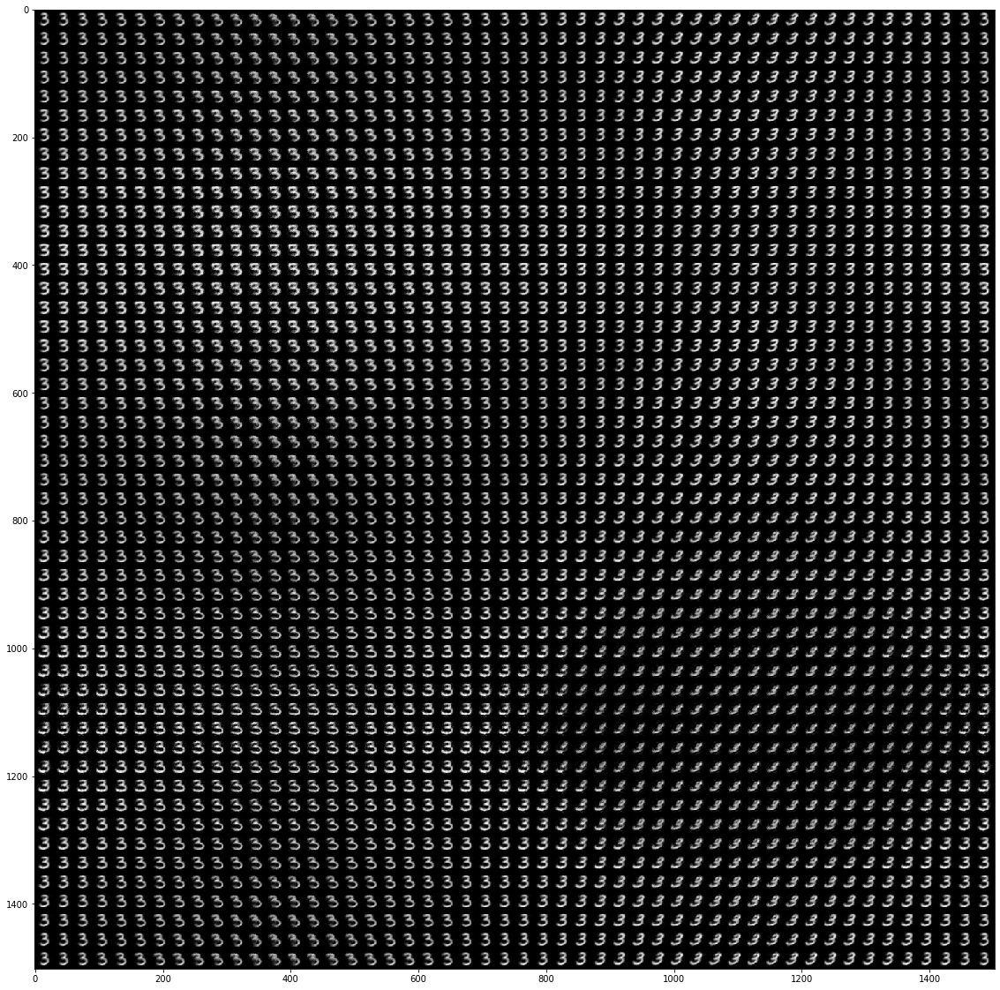

In [20]:
vplots.latent_grid_plot(
    model=model,
    condition=3,
    nb_ticks=50,
    start=0,
    stop=2*numpy.pi
)

<module 'matplotlib.pyplot' from '/home/tariq/miniconda3/envs/mldev/lib/python3.7/site-packages/matplotlib/pyplot.py'>

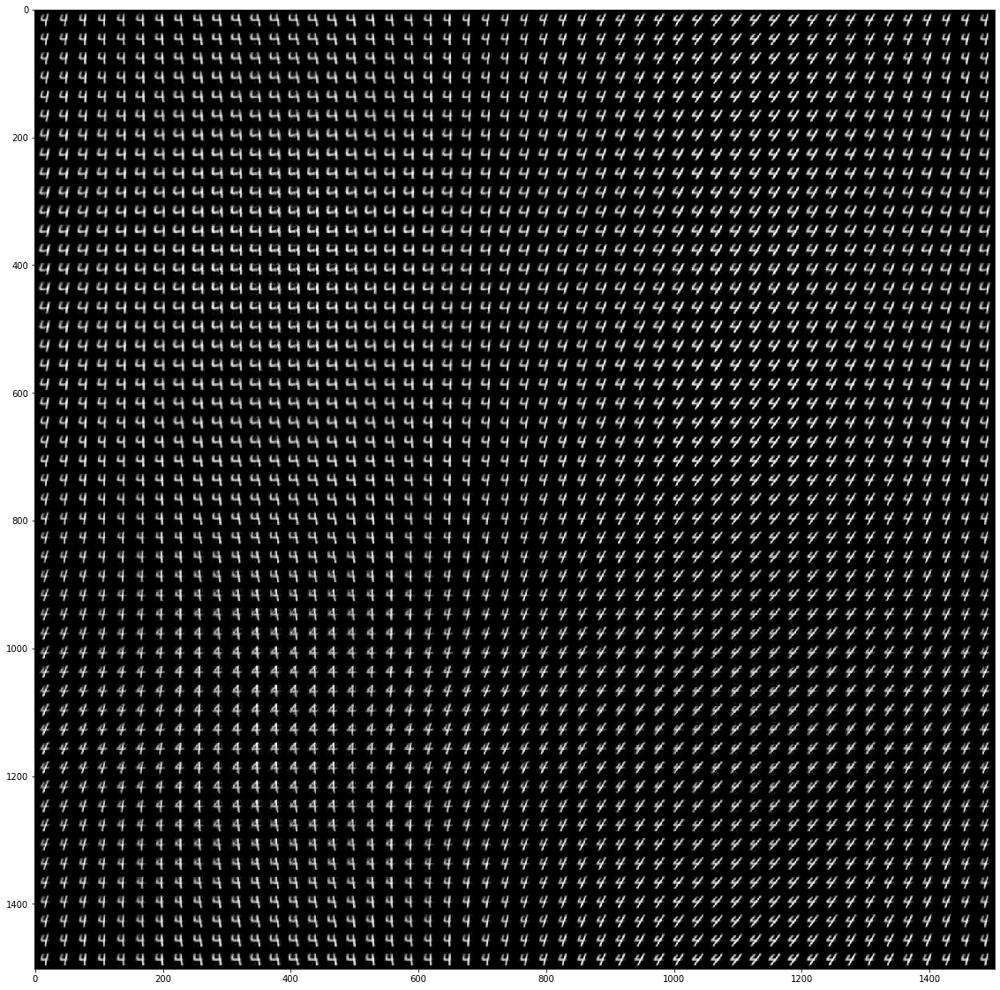

In [21]:
vplots.latent_grid_plot(
    model=model,
    condition=4,
    nb_ticks=50,
    start=0,
    stop=2*numpy.pi
)

<module 'matplotlib.pyplot' from '/home/tariq/miniconda3/envs/mldev/lib/python3.7/site-packages/matplotlib/pyplot.py'>

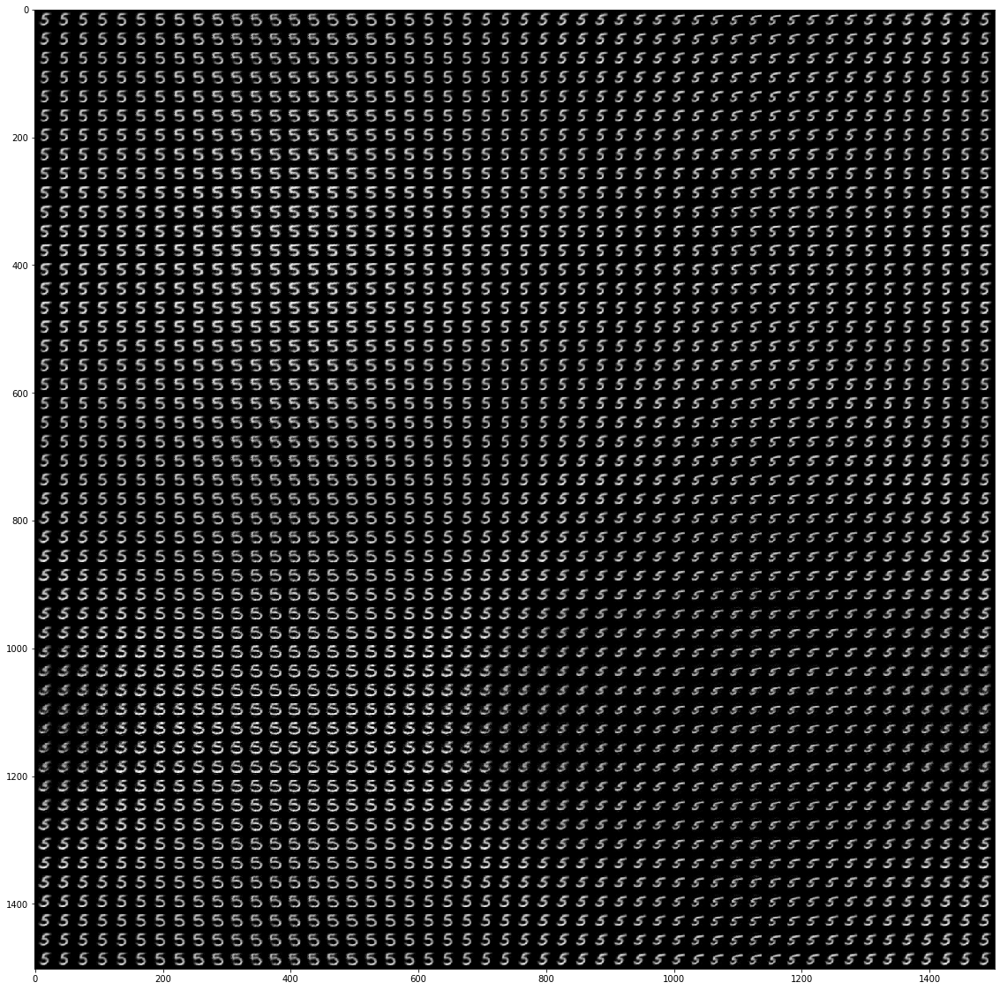

In [22]:
vplots.latent_grid_plot(
    model=model,
    condition=5,
    nb_ticks=50,
    start=0,
    stop=2*numpy.pi
)

<module 'matplotlib.pyplot' from '/home/tariq/miniconda3/envs/mldev/lib/python3.7/site-packages/matplotlib/pyplot.py'>

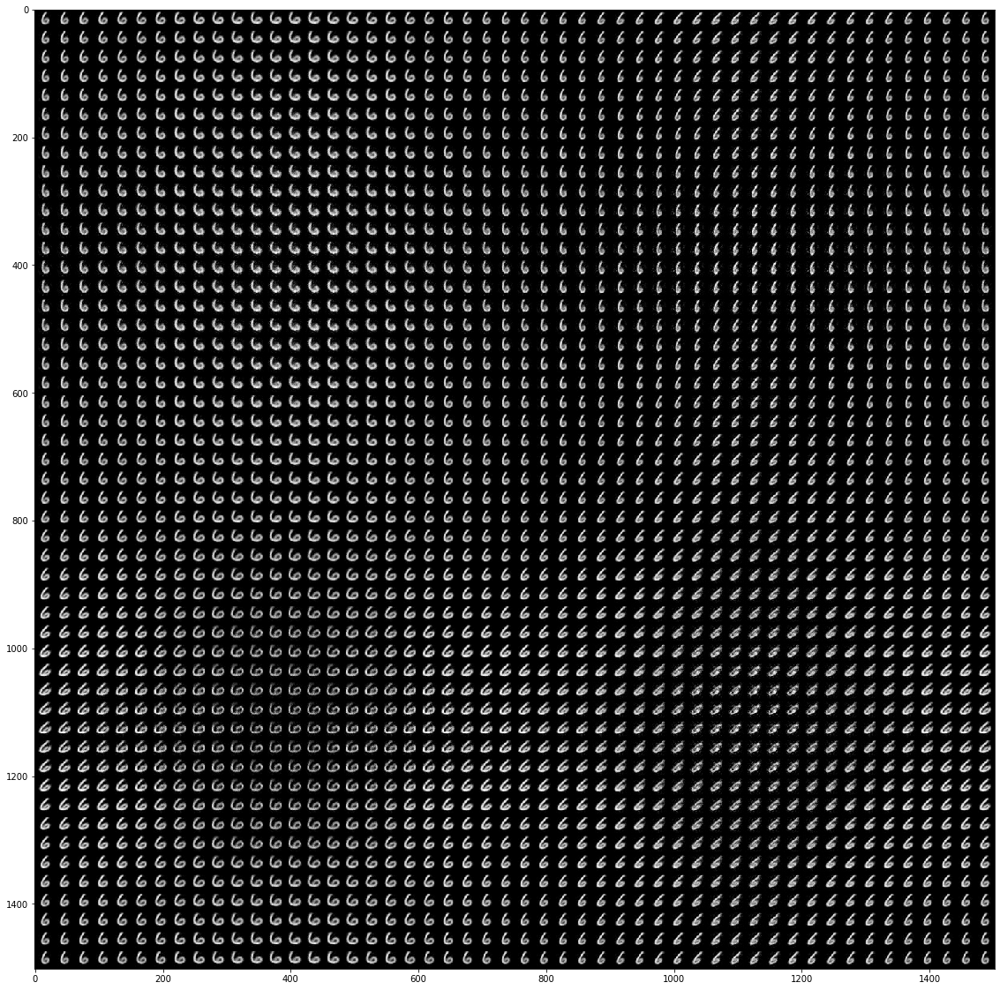

In [23]:
vplots.latent_grid_plot(
    model=model,
    condition=6,
    nb_ticks=50,
    start=0,
    stop=2*numpy.pi
)

<module 'matplotlib.pyplot' from '/home/tariq/miniconda3/envs/mldev/lib/python3.7/site-packages/matplotlib/pyplot.py'>

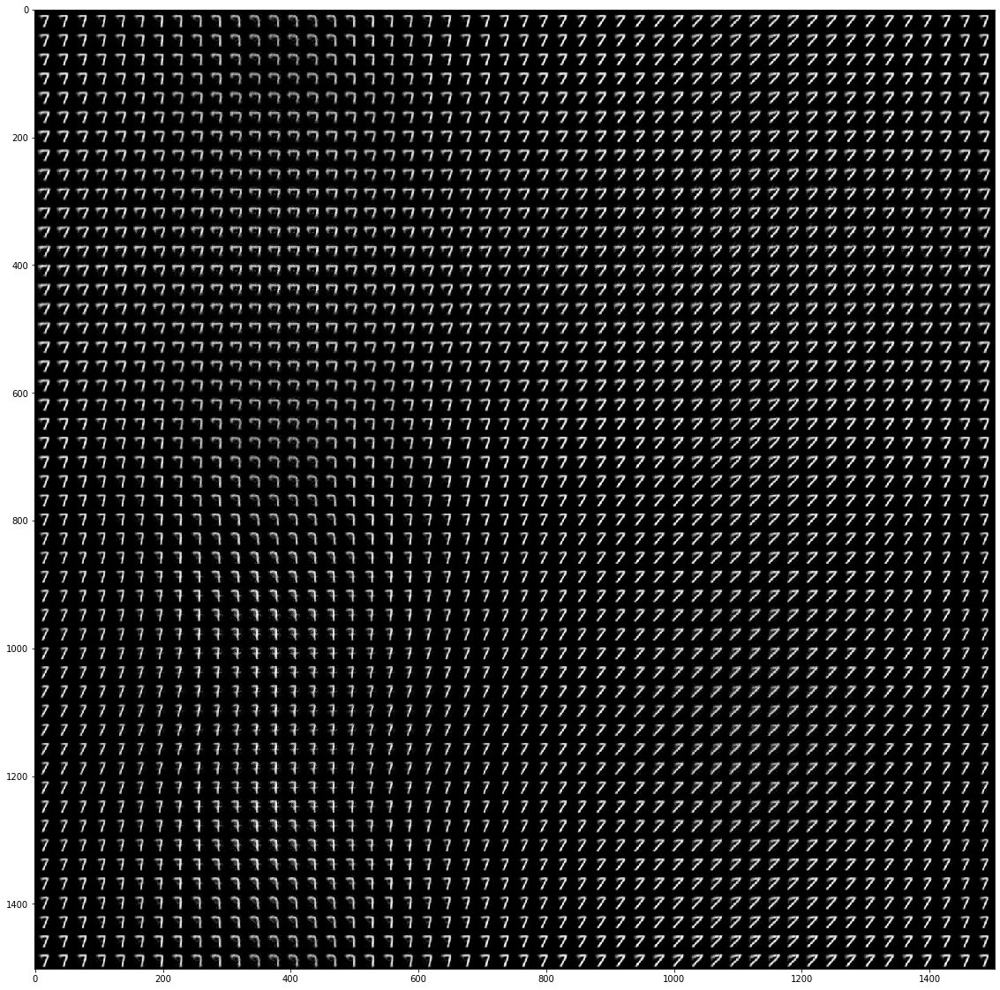

In [28]:
vplots.latent_grid_plot(
    model=model,
    condition=7,
    nb_ticks=50,
    start=0,
    stop=2*numpy.pi
)

<module 'matplotlib.pyplot' from '/home/tariq/miniconda3/envs/mldev/lib/python3.7/site-packages/matplotlib/pyplot.py'>

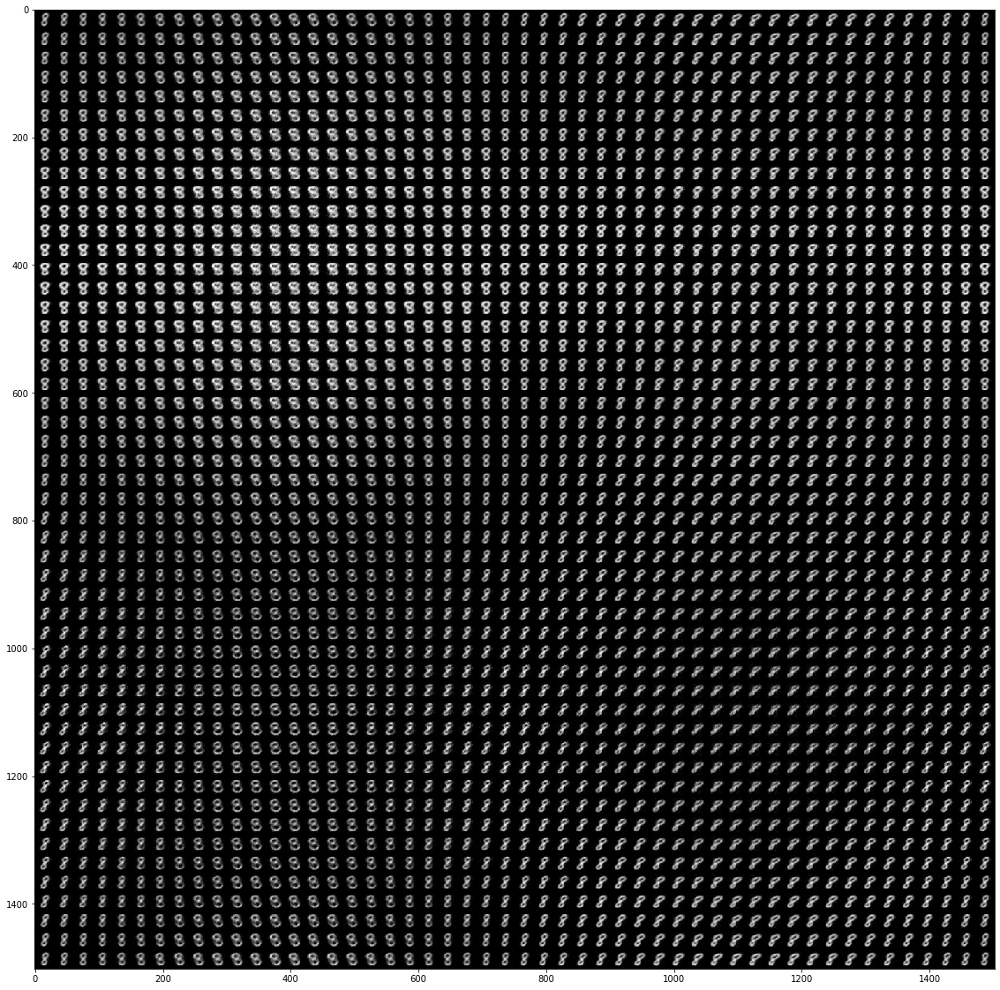

In [30]:
vplots.latent_grid_plot(
    model=model,
    condition=8,
    nb_ticks=50,
    start=0,
    stop=2*numpy.pi
)

<module 'matplotlib.pyplot' from '/home/tariq/miniconda3/envs/mldev/lib/python3.7/site-packages/matplotlib/pyplot.py'>

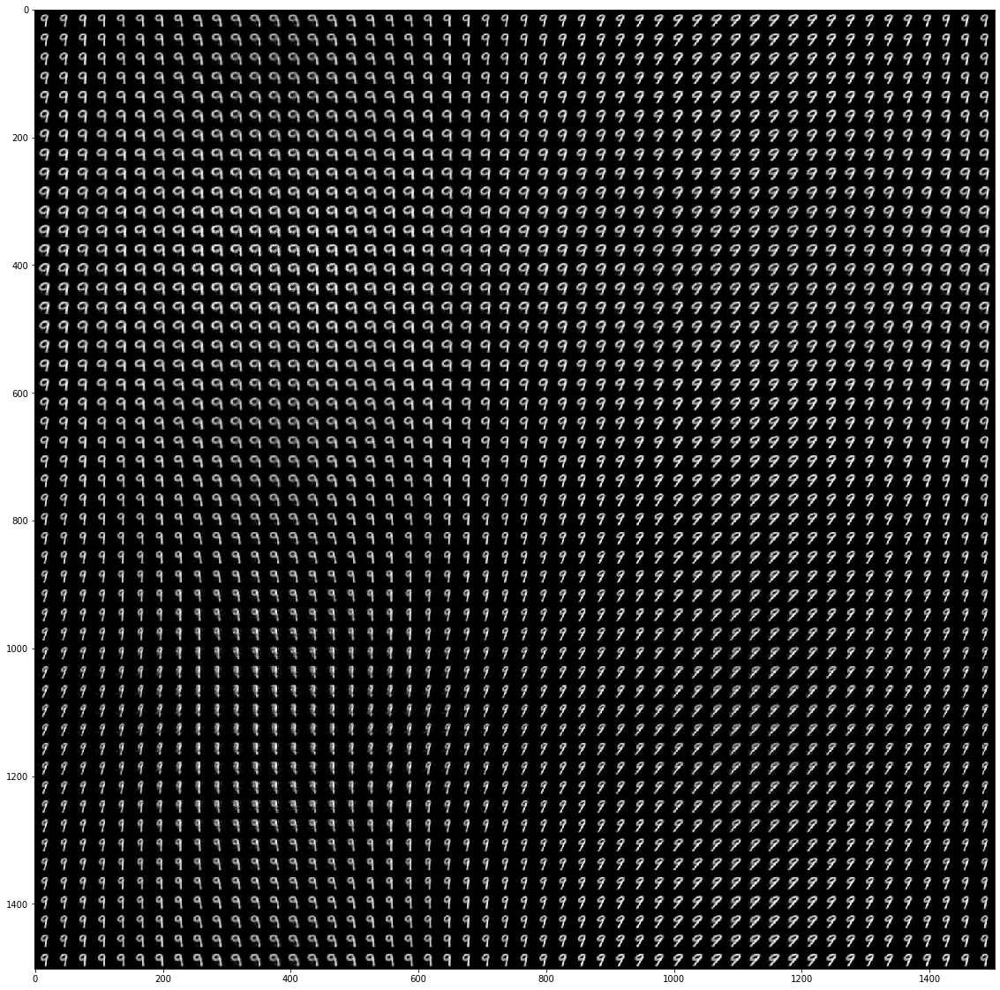

In [31]:
vplots.latent_grid_plot(
    model=model,
    condition=9,
    nb_ticks=50,
    start=0,
    stop=2*numpy.pi
)